In [ ]:
import numpy as np
import pandas as pd
pd.set_option('display.max_columns',110)
pd.set_option('display.max_rows',1000)
import itertools
import warnings
warnings.filterwarnings('ignore')
import io
import missingno as msno
%matplotlib inline

from plotly.offline import init_notebook_mode, plot, iplot
import plotly.graph_objs as go
import matplotlib.pyplot as plt
import plotly.tools as tls
import plotly.figure_factory as ff
import seaborn as sns
from sklearn.cluster import KMeans, MeanShift
from sklearn import decomposition

from sklearn.impute import SimpleImputer
from sklearn.cluster import DBSCAN

In [ ]:
from google.colab import files

uploaded = files.upload()


Saving players_22.csv to players_22 (4).csv


In [ ]:
df = pd.read_csv('players_22.csv', index_col = 'sofifa_id')
df.head(3)

,player_url,short_name,long_name,player_positions,overall,potential,value_eur,wage_eur,age,dob,height_cm,weight_kg,club_team_id,club_name,league_name,league_level,club_position,club_jersey_number,club_loaned_from,club_joined,club_contract_valid_until,nationality_id,nationality_name,nation_team_id,nation_position,nation_jersey_number,preferred_foot,weak_foot,skill_moves,international_reputation,work_rate,body_type,real_face,release_clause_eur,player_tags,player_traits,pace,shooting,passing,dribbling,defending,physic,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking_awareness,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,goalkeeping_speed,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,gk,player_face_url,club_logo_url,club_flag_url,nation_logo_url,nation_flag_url
sofifa_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,"RW, ST, CF",93,93,78000000.0,320000.0,34,1987-06-24,170,72,73.0,Paris Saint-Germain,French Ligue 1,1.0,RW,30.0,NaN,2021-08-10,2023.0,52,Argentina,1369.0,RW,10.0,Left,4,4,5,Medium/Low,Unique,Yes,144300000.0,"#Dribbler, #Distance Shooter, #FK Specialist, ...","Finesse Shot, Long Shot Taker (AI), Playmaker ...",85.0,92.0,91.0,95.0,34.0,65.0,85,95,70,91,88,96,93,94,91,96,91,80,91,94,95,86,68,72,69,94,44,40,93,95,75,96,20,35,24,6,11,15,14,8,NaN,89+3,89+3,89+3,92,93,93,93,92,93,93,93,91+2,87+3,87+3,87+3,91+2,66+3,64+3,64+3,64+3,66+3,61+3,50+3,50+3,50+3,61+3,19+3,https://cdn.sofifa.net/players/158/023/22_120.png,https://cdn.sofifa.net/teams/73/60.png,https://cdn.sofifa.net/flags/fr.png,https://cdn.sofifa.net/teams/1369/60.png,https://cdn.sofifa.net/flags/ar.png
188545,https://sofifa.com/player/188545/robert-lewand...,R. Lewandowski,Robert Lewandowski,ST,92,92,119500000.0,270000.0,32,1988-08-21,185,81,21.0,FC Bayern München,German 1. Bundesliga,1.0,ST,9.0,NaN,2014-07-01,2023.0,37,Poland,1353.0,RS,9.0,Right,4,4,5,High/Medium,Unique,Yes,197200000.0,"#Aerial Threat, #Distance Shooter, #Clinical F...","Solid Player, Finesse Shot, Outside Foot Shot,...",78.0,92.0,79.0,86.0,44.0,82.0,71,95,90,85,89,85,79,85,70,88,77,79,77,93,82,90,85,76,86,87,81,49,95,81,90,88,35,42,19,15,6,12,8,10,NaN,90+2,90+2,90+2,85,88,88,88,85,86+3,86+3,86+3,84+3,80+3,80+3,80+3,84+3,64+3,66+3,66+3,66+3,64+3,61+3,60+3,60+3,60+3,61+3,19+3,https://cdn.sofifa.net/players/188/545/22_120.png,https://cdn.sofifa.net/teams/21/60.png,https://cdn.sofifa.net/flags/de.png,https://cdn.sofifa.net/teams/1353/60.png,https://cdn.sofifa.net/flags/pl.png
20801,https://sofifa.com/player/20801/c-ronaldo-dos-...,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,"ST, LW",91,91,45000000.0,270000.0,36,1985-02-05,187,83,11.0,Manchester United,English Premier League,1.0,ST,7.0,NaN,2021-08-27,2023.0,38,Portugal,1354.0,ST,7.0,Right,4,5,5,High/Low,Unique,Yes,83300000.0,"#Aerial Threat, #Dribbler, #Distance Shooter, ...","Power Free-Kick, Flair, Long Shot Taker (AI), ...",87.0,94.0,80.0,88.0,34.0,75.0,87,95,90,80,86,88,81,84,77,88,85,88,86,94,74,94,95,77,77,93,63,29,95,76,88,95,24,32,24,7,11,15,14,11,NaN,90+1,90+1,90+1,88,89,89,89,88,86+3,86+3,86+3,86+3,78+3,78+3,78+3,86+3,63+3,59+3,59+3,59+3,63+3,60+3,53+3,53+3,53+3,60+3,20+3,https://cdn.sofifa.net/players/020/801/22_120.png,https://cdn.sofifa.net/teams/11/60.png,https://cdn.so

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 19239 entries, 158023 to 264540
Columns: 109 entries, player_url to nation_flag_url
dtypes: float64(16), int64(43), object(50)
memory usage: 16.1+ MB


In [ ]:
df[df.columns[df.isnull().any()]].isnull().sum() * 100 / df.shape[0]

value_eur                     0.384635
wage_eur                      0.317064
club_team_id                  0.317064
club_name                     0.317064
league_name                   0.317064
league_level                  0.317064
club_position                 0.317064
club_jersey_number            0.317064
club_loaned_from             94.272052
club_joined                   6.045013
club_contract_valid_until     0.317064
nation_team_id               96.054889
nation_position              96.054889
nation_jersey_number         96.054889
release_clause_eur            6.112584
player_tags                  92.510006
player_traits                51.151307
pace                         11.081657
shooting                     11.081657
passing                      11.081657
dribbling                    11.081657
defending                    11.081657
physic                       11.081657
goalkeeping_speed            88.918343
club_logo_url                 0.317064
club_flag_url            

### Aqui arriba vemos rapidamente que existen 7 columnas con mas del 80% de los datos como nan, por lo que procederemos a eliminarlas

In [ ]:
df = df.drop(columns = ['nation_logo_url','player_tags','player_traits',
                        'nation_jersey_number','nation_position','nation_team_id','club_loaned_from',
                       'goalkeeping_speed'])

### Tambien eliminamos columnas que no aportan valor alguno al estudio actual

In [ ]:
df = df.drop(columns = ['player_url','long_name','club_position','nationality_id','player_face_url',
                        'club_logo_url','club_flag_url','nation_flag_url','body_type', 'real_face'])


### Analizamos valores faltantes en el dataset

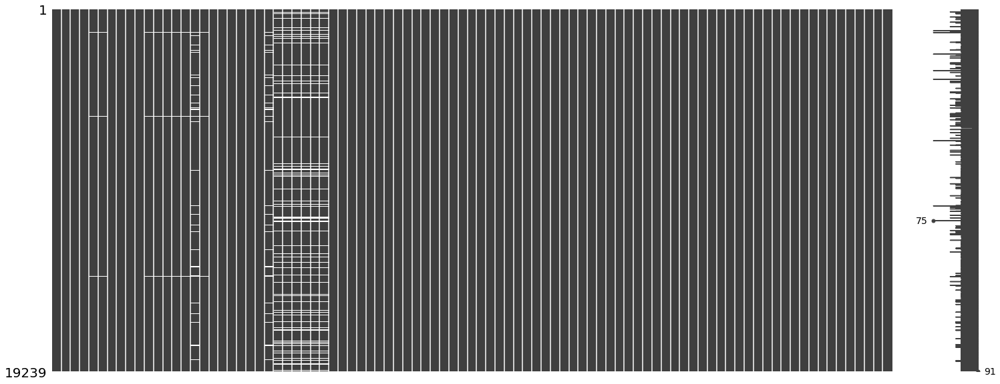

In [ ]:
msno.matrix(df);

In [ ]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
overall,19239.0,6.577218e+01,6.880232e+00,47.0,61.0,66.0,70.0,93.0
potential,19239.0,7.107937e+01,6.086213e+00,49.0,67.0,71.0,75.0,95.0
value_eur,19165.0,2.850452e+06,7.613700e+06,9000.0,475000.0,975000.0,2000000.0,194000000.0
wage_eur,19178.0,9.017989e+03,1.947018e+04,500.0,1000.0,3000.0,8000.0,350000.0
age,19239.0,2.521082e+01,4.748235e+00,16.0,21.0,25.0,29.0,54.0
height_cm,19239.0,1.812997e+02,6.863179e+00,155.0,176.0,181.0,186.0,206.0
weight_kg,19239.0,7.494303e+01,7.069434e+00,49.0,70.0,75.0,80.0,110.0
club_team_id,19178.0,5.058050e+04,5.440187e+04,1.0,479.0,1938.0,111139.0,115820.0
league_level,19178.0,1.354364e+00,7.478651e-01,1.0,1.0,1.0,1.0,5.0
club_jersey_number,19178.0,2.094525e+01,1.790937e+01,1.0,9.0,18.0,27.0,99.0


### Distribucion de la edad en los jugadores:

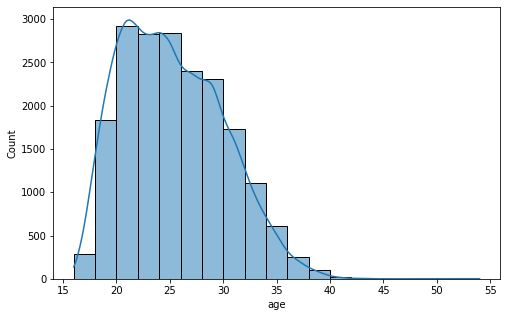

In [ ]:
plt.figure(figsize = (8,5))
sns.histplot(data = df, x = 'age',bins = 10, kde = True, binwidth = 2);

### Distribucion del overall (puntaje) de los jugadores:

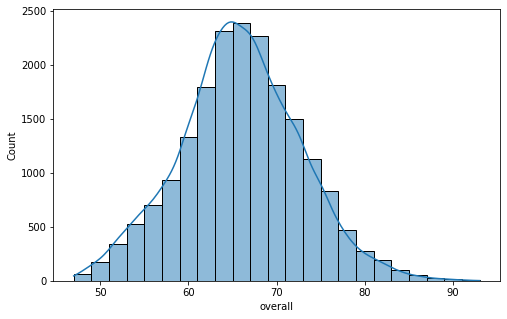

In [ ]:
plt.figure(figsize = (8,5))
sns.histplot(data = df, x = 'overall',bins = 10, kde = True, binwidth = 2);

### Nivel de liga se encuentran los jugadores, la mayoria estan en un nivel 1; osea la mas competetiva:

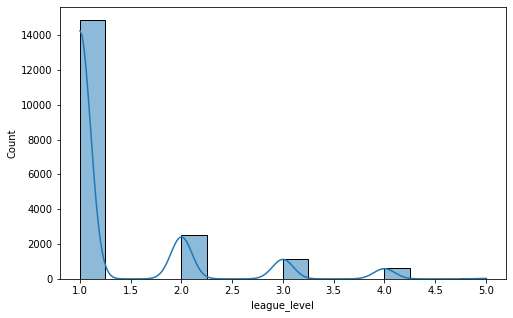

In [ ]:
plt.figure(figsize = (8,5))
sns.histplot(data = df, x = 'league_level', kde = True);

### Notamos que ahora los jugadores tienen mas de una posicion, a diferencia del dataset del fifa 19. Para fines utiles y practicos vamos a quedarnos tan solo con la posicion principal de cada jugador. La cual es la primera de cada fila:

In [ ]:
df.player_positions.head()

sofifa_id
158023    RW, ST, CF
188545            ST
20801         ST, LW
190871       LW, CAM
192985       CM, CAM
Name: player_positions, dtype: object

In [ ]:
df[['Posicion','posicion2','posicion3']] = df.player_positions.str.split(pat = ',', expand = True)
df = df.drop(columns = ['player_positions','posicion2','posicion3'])
df.Posicion.head()

sofifa_id
158023    RW
188545    ST
20801     ST
190871    LW
192985    CM
Name: Posicion, dtype: object

### Mejor jugador por cada posicion:

In [ ]:
best_players_per_position = df.loc[df.groupby(df['Posicion'])['overall'].idxmax()][['Posicion',
                                                                                     'short_name','overall']]
best_players_per_position

,Posicion,short_name,overall
sofifa_id,,,
212198,CAM,Bruno Fernandes,88
203376,CB,V. van Dijk,89
215914,CDM,N. Kanté,90
165153,CF,K. Benzema,89
192985,CM,K. De Bruyne,91
200389,GK,J. Oblak,91
216267,LB,A. Robertson,87
200104,LM,H. Son,89
190871,LW,Neymar Jr,91


### Conteo de jugadores por cada posicion:

In [ ]:
pd.DataFrame(df.Posicion.value_counts())

,Posicion
CB,3339
ST,2608
CM,2173
GK,2132
CDM,1665
LB,1360
RB,1346
CAM,1151
RM,1028
LM,1016


### Aqui abajo vemos los clubes que tienen el mejor promedio de overall

In [ ]:
club_avg_overall = df.groupby('club_name')['overall'].mean().reset_index().sort_values('overall',ascending = False)
club_avg_overall.head()

,club_name,overall
368,Juventus,79.961538
470,Paris Saint-Germain,79.454545
358,Inter,78.857143
241,FC Bayern München,78.071429
412,Manchester United,78.000000


### Procedemos a reducir la base de datos. Dejando jugadores tan solo con un overall mayor a 70. Y tan solo algunas columnas seleccionadas
### Tambien creamos variables separando las skills segun el puesto.

In [ ]:
n = 10000

df_n = df.iloc[:n]
df_n = df_n[(df_n['overall']>70)]

# Aqui abajo creamos una variable llamada Posicion2, donde resuma las posiciones de los jugadores
# en tan solo 4 posiciones
Delantero = ['RF','ST','LW','LF','RS','LS','RM','LM','RW']
Mediocampista = ['RCM','LCM','LDM','CAM','CDM','LAM','RDM','CM','RAM','CF']
Defensor = ['RCB','CB','LCB','LB','RB','RWB','LWB']
Arquero = ['GK']

def pos2(posicion):
    if posicion in Delantero:
        return 'Delantero'
    elif posicion in Mediocampista:
        return 'Mediocampista'
    elif posicion in Defensor:
        return 'Defensor'
    elif posicion in Arquero:
        return 'Arquero'
    
    else:
        return 'nan'
    
df_n['Posicion2'] = df_n['Posicion'].apply(lambda x: pos2(x))

# Creamos un objeto con todas las skills
skills_ra = [ 'pace', 'shooting', 'passing', 'dribbling',
       'defending', 'physic', 'attacking_crossing', 'attacking_finishing',
       'attacking_heading_accuracy', 'attacking_short_passing',
       'attacking_volleys', 'skill_dribbling', 'skill_curve',
       'skill_fk_accuracy', 'skill_long_passing', 'skill_ball_control',
       'movement_acceleration', 'movement_sprint_speed', 'movement_agility',
       'movement_reactions', 'movement_balance', 'power_shot_power',
       'power_jumping', 'power_stamina', 'power_strength', 'power_long_shots',
       'mentality_aggression', 'mentality_interceptions',
       'mentality_positioning', 'mentality_vision', 'mentality_penalties',
       'mentality_composure', 'defending_marking_awareness',
       'defending_standing_tackle', 'defending_sliding_tackle',
       'goalkeeping_diving', 'goalkeeping_handling', 'goalkeeping_kicking',
       'goalkeeping_positioning', 'goalkeeping_reflexes']

# Skills de arquero:
skills_gk = ['goalkeeping_diving', 'goalkeeping_handling', 'goalkeeping_kicking',
       'goalkeeping_positioning', 'goalkeeping_reflexes','Posicion2']

# Skills de defensor:
skills_def = [ 'defending_marking_awareness',
       'defending_standing_tackle', 'defending_sliding_tackle','Posicion2']
# Skills de atacantes:
skills_at = ['attacking_crossing', 'attacking_finishing',
       'attacking_heading_accuracy', 'attacking_short_passing', 'Posicion2']

# Skills de mediocampo:
skills_mid = ['skill_dribbling', 'skill_curve',
       'skill_fk_accuracy', 'skill_long_passing', 'skill_ball_control', 'Posicion2']

# Skills de Movimiento y balance
skills_movement = ['movement_acceleration', 'movement_sprint_speed', 'movement_agility',
       'movement_reactions', 'movement_balance', 'Posicion2']

# Skills de Fuerza
skills_power = ['power_shot_power',
       'power_jumping', 'power_stamina', 'power_strength', 'power_long_shots', 'Posicion2']

# Skills Mentales
skills_mental = ['mentality_aggression', 'mentality_interceptions',
       'mentality_positioning', 'mentality_vision', 'mentality_penalties',
       'mentality_composure', 'Posicion2']


print(len(skills_ra), 'Variables numericas de desempeño segun habilidades')

40 Variables numericas de desempeño segun habilidades


In [ ]:
posiciones=df_n.loc[:, 'Posicion2']

In [ ]:
posiciones.value_counts()

Defensor         1485
Delantero        1332
Mediocampista    1332
Arquero           444
Name: Posicion2, dtype: int64

In [ ]:
df_n.shape

(4595, 92)

### Aqui comparamos dos habilidades (disparo al arco y pase), y a su vez creamos dos colores para diferenciar los jugadores que son derechos (naranjas) y los jugadores que son zurdos (azules)

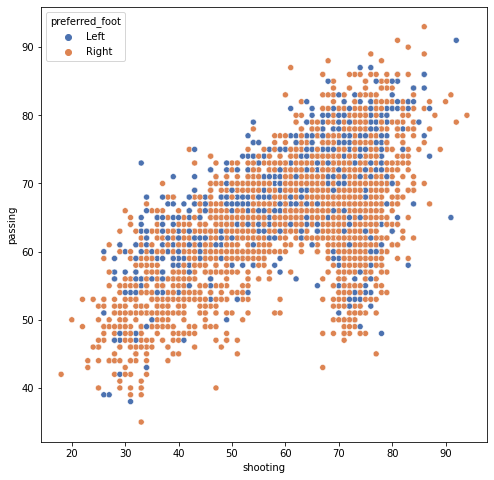

In [ ]:
plt.figure(figsize = (8,8))
sns.scatterplot(data = df_n, x = 'shooting', y = 'passing', hue = 'preferred_foot', palette = 'deep');

### Aqui comparamos dos habilidades (dribbling y pase), y a su vez creamos dos colores para diferenciar los jugadores que son derechos (naranjas) y los jugadores que son zurdos (azules)

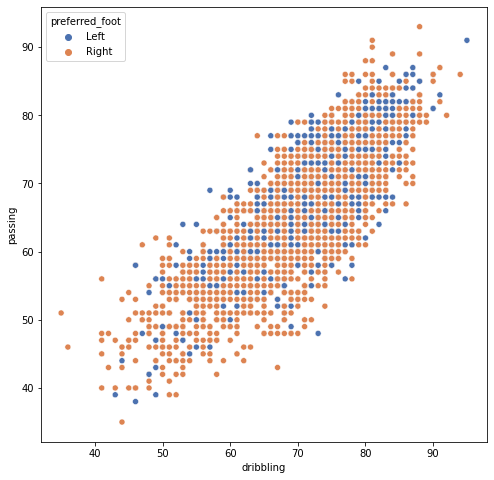

In [ ]:
plt.figure(figsize = (8,8))
sns.scatterplot(data = df_n, x = 'dribbling', y = 'passing', hue = 'preferred_foot', palette = 'deep');

### Procedemos a crear al jugador perfecto, y al jugador promedio:

In [ ]:
MachineGunDict = {'short_name':'MachineGun','overall':99}
for skills in skills_ra:
    MachineGunDict [skills] = 99
    
df_n = df_n.append(MachineGunDict, ignore_index = True)

JugadorPromedioDict = {'short_name':'Promedio','overall':df_n.overall.mean()}
for skills in skills_ra:
    JugadorPromedioDict [skills] = df_n[skills].mean()
    
df_n = df_n.append(JugadorPromedioDict, ignore_index = True)

In [ ]:
df_skills = df_n[skills_ra+ ['Posicion2']]

### Aqui visualizamos las skills propias de arqueros comparandolas para todos

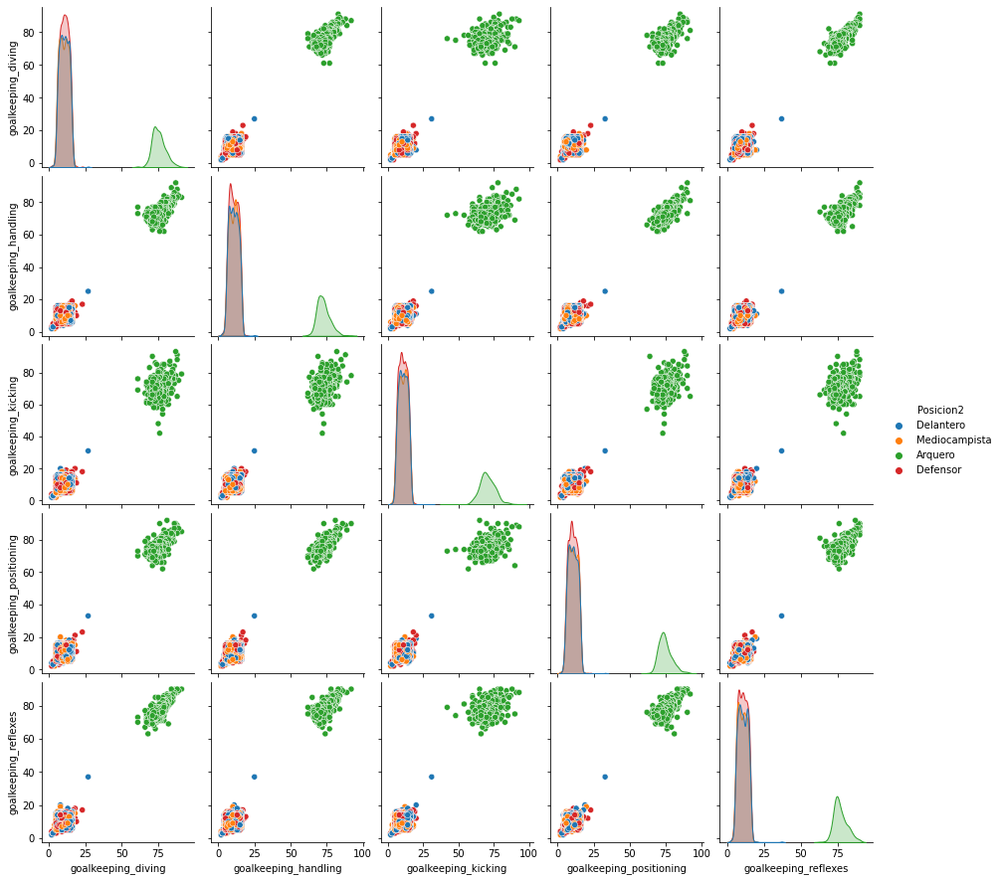

In [ ]:
sns.pairplot(df_skills[skills_gk], hue = 'Posicion2');

### Aqui visualizamos las skills propias de defensores comparandolas para todos

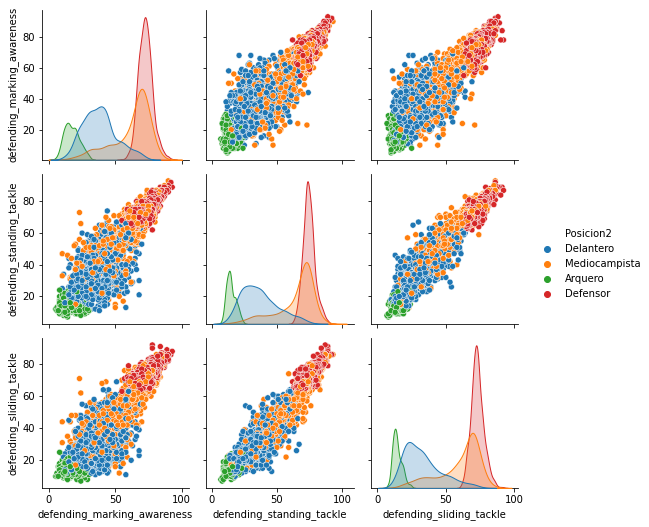

In [ ]:
sns.pairplot(df_skills[skills_def], hue ='Posicion2');

### Aqui visualizamos las skills propias de mediocampistas comparandolas para todos

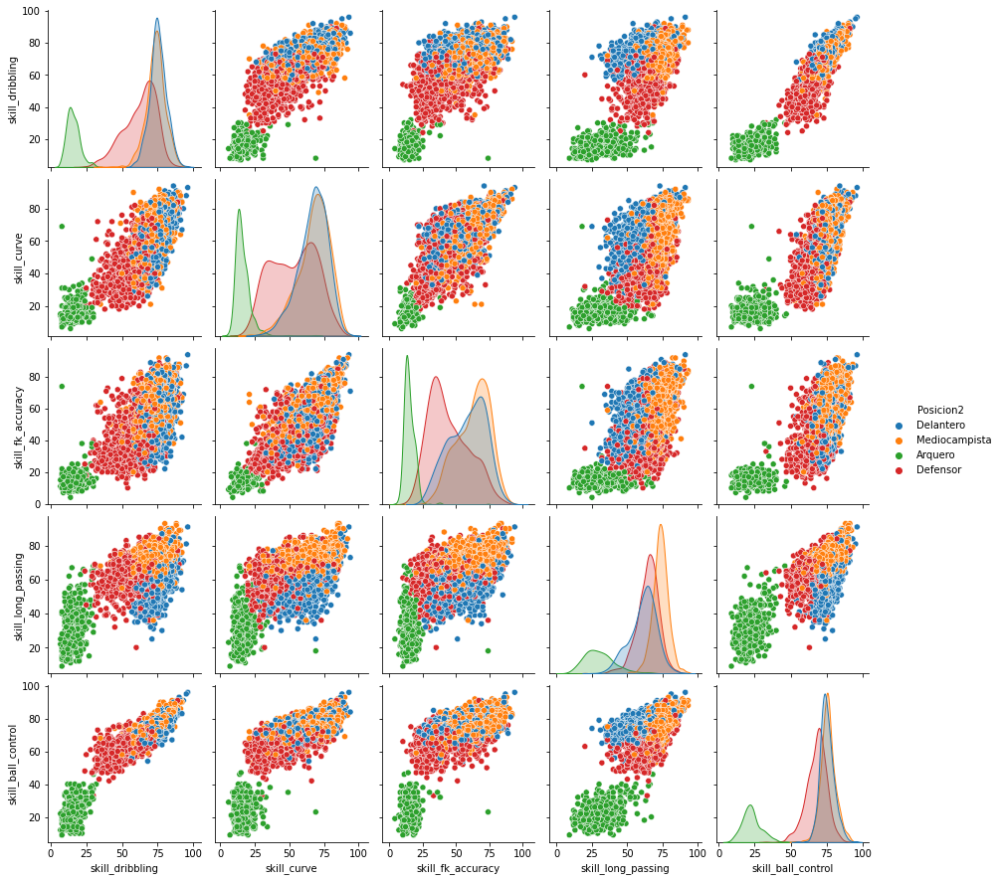

In [ ]:
sns.pairplot(df_skills[skills_mid], hue = 'Posicion2');

### Aqui visualizamos las skills propias de delanteros comparandolas para todos

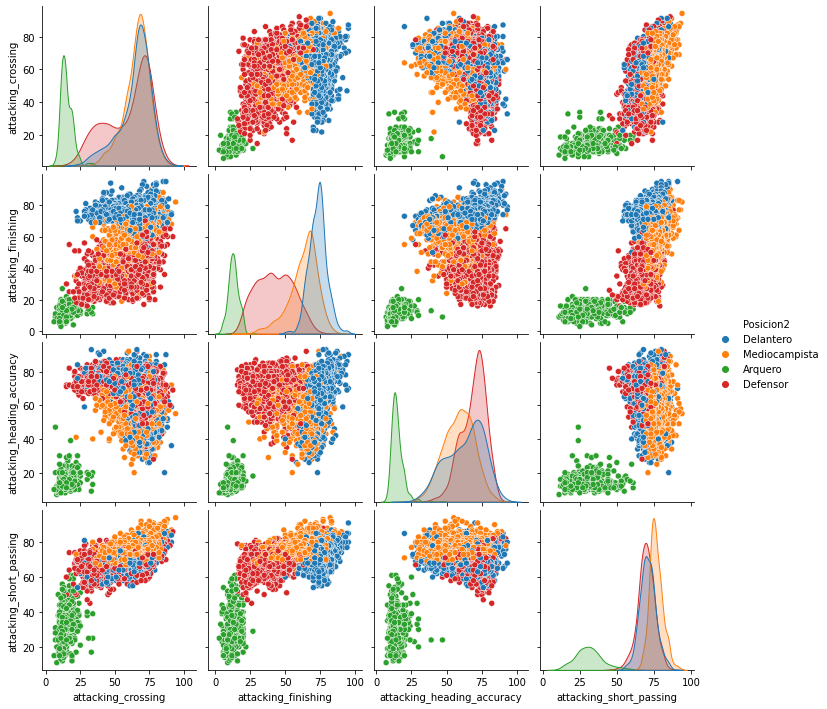

In [ ]:
sns.pairplot(df_skills[skills_at], hue = 'Posicion2');

### Aqui visualizamos las skills propias de agilidad y movimientos

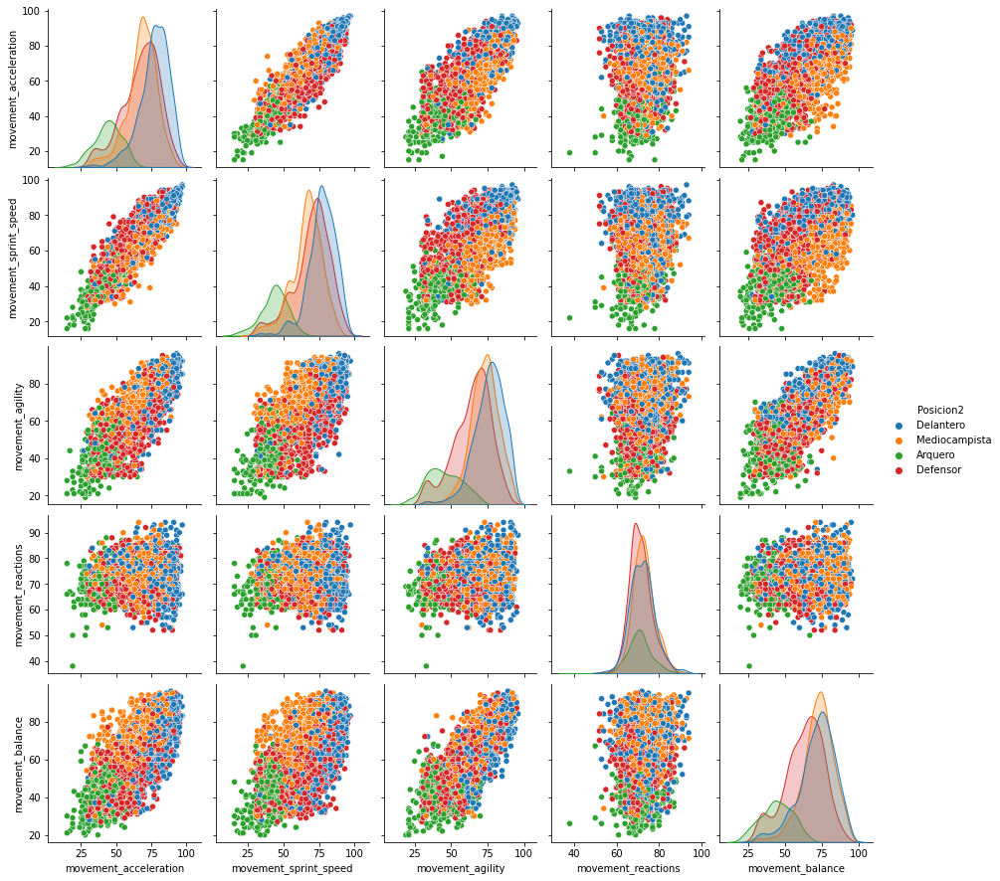

In [ ]:
sns.pairplot(df_skills[skills_movement], hue = 'Posicion2');

### Aqui visualizamos las skills de mentalidad

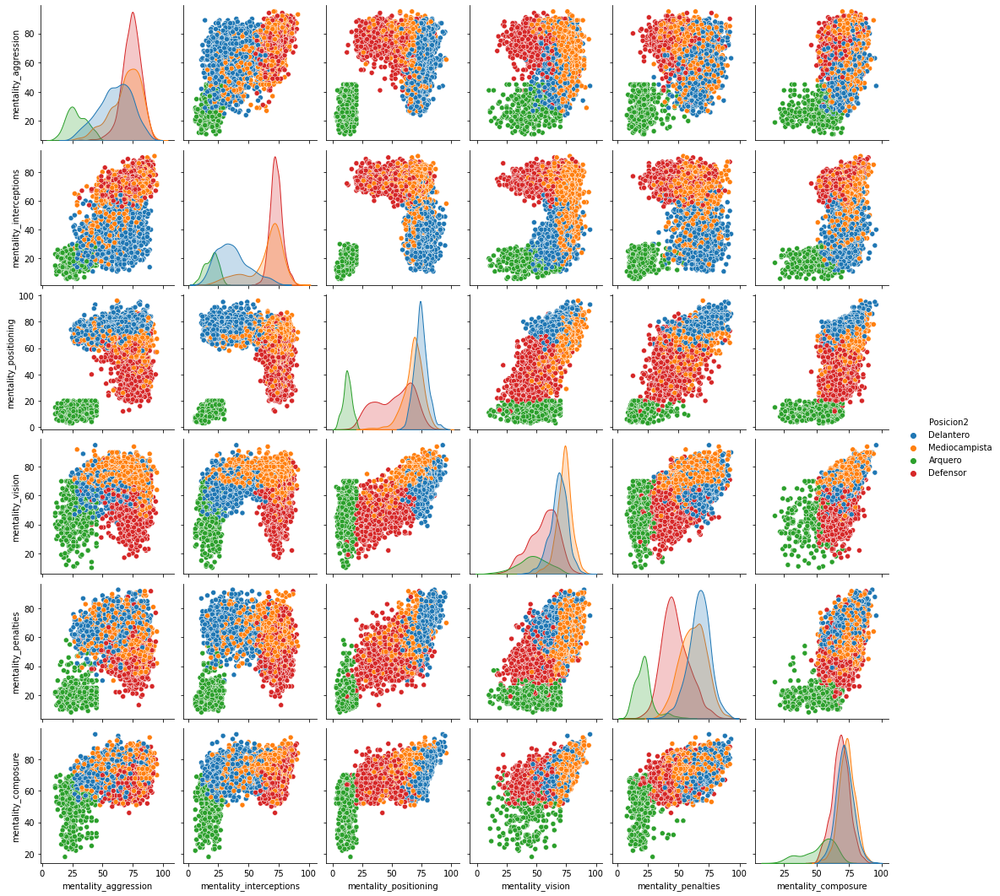

In [ ]:
sns.pairplot(df_skills[skills_mental], hue = 'Posicion2');

### Aqui visualizamos las skills de potencia y fuerza

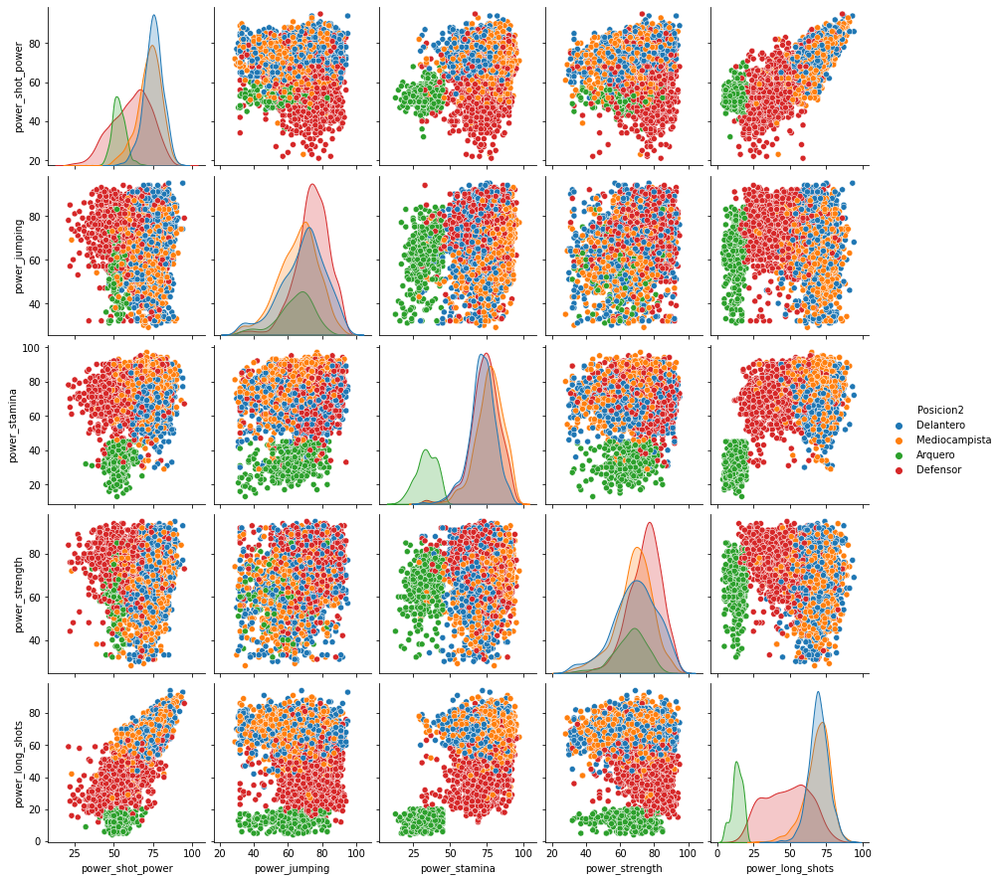

In [ ]:
sns.pairplot(df_skills[skills_power], hue = 'Posicion2');

# Clustering con KMeans

In [ ]:
df2 = df_skills.copy()
df2 = df2.drop(columns = 'Posicion2')
imputer = SimpleImputer (missing_values = np.nan, strategy = 'most_frequent')
df2 = pd.DataFrame ( imputer.fit_transform(df2), columns = df2.columns, index = df2.index)

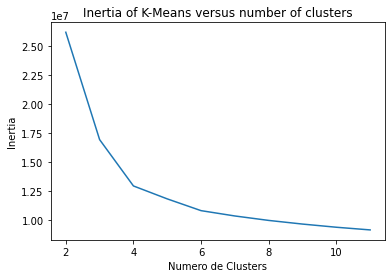

In [ ]:
scores = [KMeans (n_clusters = i).fit(df2).inertia_ for i in range (2,12)]

plt.plot(np.arange(2,12), scores);
plt.xlabel('Numero de Clusters')
plt.ylabel('Inertia')
plt.title('Inertia of K-Means versus number of clusters');
## Se seleccionan cuatro clusters

In [ ]:
n_clust = 4

km = KMeans(n_clusters = n_clust)
km.fit(df2)

clusters = km.labels_

In [ ]:
df_clust = df2.copy()
df_clust['kmeans4'] = km.labels_

print('KMeans encontro: ', max(km.labels_)+1, 'clusters, nosotros forzamos la cantidad')
df_clust

KMeans encontro:  4 clusters, nosotros forzamos la cantidad


,pace,shooting,passing,dribbling,defending,physic,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking_awareness,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,kmeans4
0,85.000000,92.000000,91.000000,95.000000,34.000000,65.000000,85.000000,95.000000,70.000000,91.000000,88.000000,96.000000,93.000000,94.000000,91.00000,96.000000,91.000000,80.000000,91.00000,94.000000,95.000000,86.000000,68.00000,72.000000,69.00000,94.000000,44.000000,40.000000,93.000000,95.000000,75.000000,96.0000,20.000000,35.00000,24.00000,6.000000,11.000000,15.000000,14.000000,8.000000,3
1,78.000000,92.000000,79.000000,86.000000,44.000000,82.000000,71.000000,95.000000,90.000000,85.000000,89.000000,85.000000,79.000000,85.000000,70.00000,88.000000,77.000000,79.000000,77.00000,93.000000,82.000000,90.000000,85.00000,76.000000,86.00000,87.000000,81.000000,49.000000,95.000000,81.000000,90.000000,88.0000,35.000000,42.00000,19.00000,15.000000,6.000000,12.000000,8.000000,10.000000,3
2,87.000000,94.000000,80.000000,88.000000,34.000000,75.000000,87.000000,95.000000,90.000000,80.000000,86.000000,88.000000,81.000000,84.000000,77.00000,88.000000,85.000000,88.000000,86.00000,94.000000,74.000000,94.000000,95.00000,77.000000,77.00000,93.000000,63.000000,29.000000,95.000000,76.000000,88.000000,95.0000,24.000000,32.00000,24.00000,7.000000,11.000000,15.000000,14.000000,11.000000,3
3,91.000000,83.000000,86.000000,94.000000,37.000000,63.000000,85.000000,83.000000,63.000000,86.000000,86.000000,95.000000,88.000000,87.000000,81.00000,95.000000,93.000000,89.000000,96.00000,89.000000,84.000000,80.000000,64.00000,81.000000,53.00000,81.000000,63.000000,37.000000,86.000000,90.000000,93.000000,93.0000,35.000000,32.00000,29.00000,9.000000,9.000000,15.000000,15.000000,11.000000,3
4,76.000000,86.000000,93.000000,88.000000,64.000000,78.000000,94.000000,82.000000,55.000000,94.000000,82.000000,88.000000,85.000000,83.000000,93.00000,91.000000,76.000000,76.000000,79.00000,91.000000,78.000000,91.000000,63.00000,89.000000,74.00000,91.000000,76.000000,66.000000,88.000000,94.000000,83.000000,89.0000,68.000000,65.00000,53.00000,15.000000,13.000000,5.000000,10.000000,13.000000,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4590,81.000000,51.000000,66.000000,70.000000,66.000000,67.000000,70.000000,61.000000,49.000000,71.000000,29.000000,71.000000,74.000000,35.000000,69.00000,72.000000,80.000000,82.000000,67.00000,58.000000,65.000000,45.000000,69.00000,73.000000,70.00000,40.000000,50.000000,64.000000,65.000000,59.000000,40.000000,70.0000,68.000000,70.00000,67.00000,12.000000,12.000000,11.000000,15.000000,9.000000,2
4591,76.000000,70.000000,60.000000,65.000000,39.000000,71.000000,64.000000,74.000000,72.000000,63.000000,58.000000,66.000000,56.000000,49.000000,57.00000,65.000000,79.000000,74.000000,55.00000,70.000000,75.000000,74.000000,68.00000,65.000000,74.00000,63.000000,70.000000,30.000000,73.000000,59.000000,63.000000,59.0000,35.000000,38.00000,34.00000,14.000000,15.000000,14.000000,12.000000,8.000000,3
4592,61.000000,62.000000,67.000000,71.000000,65.000000,73.000000,57.000000,61.000000,54.000000,70.000000,61.000000,71.000000,60.000000,49.000000,74.00000,78.000000,59.000000,62.000000,53.00000,71.000000,55.000000,62.000000,61.00000,78.000000,72.00000,66.000000,72.000000,66.000000,68.000000,71.000000,48.000000,74.0000,64.000000,70.

In [ ]:
# Creamos un objeto con todas las skills
skills_ra = [ 'pace', 'shooting', 'passing', 'dribbling',
       'defending', 'physic', 'attacking_crossing', 'attacking_finishing',
       'attacking_heading_accuracy', 'attacking_short_passing',
       'attacking_volleys', 'skill_dribbling', 'skill_curve',
       'skill_fk_accuracy', 'skill_long_passing', 'skill_ball_control',
       'movement_acceleration', 'movement_sprint_speed', 'movement_agility',
       'movement_reactions', 'movement_balance', 'power_shot_power',
       'power_jumping', 'power_stamina', 'power_strength', 'power_long_shots',
       'mentality_aggression', 'mentality_interceptions',
       'mentality_positioning', 'mentality_vision', 'mentality_penalties',
       'mentality_composure', 'defending_marking_awareness',
       'defending_standing_tackle', 'defending_sliding_tackle',
       'goalkeeping_diving', 'goalkeeping_handling', 'goalkeeping_kicking',
       'goalkeeping_positioning', 'goalkeeping_reflexes']

# Skills de arquero:
skills_gk = ['goalkeeping_diving', 'goalkeeping_handling', 'goalkeeping_kicking',
       'goalkeeping_positioning', 'goalkeeping_reflexes','kmeans4']

# Skills de defensor:
skills_def = [ 'defending_marking_awareness',
       'defending_standing_tackle', 'defending_sliding_tackle','kmeans4']
# Skills de atacantes:
skills_at = ['attacking_crossing', 'attacking_finishing',
       'attacking_heading_accuracy', 'attacking_short_passing', 'kmeans4']

# Skills de mediocampo:
skills_mid = ['skill_dribbling', 'skill_curve',
       'skill_fk_accuracy', 'skill_long_passing', 'skill_ball_control', 'kmeans4']

# Skills de Movimiento y balance
skills_movement = ['movement_acceleration', 'movement_sprint_speed', 'movement_agility',
       'movement_reactions', 'movement_balance', 'kmeans4']

# Skills de Fuerza
skills_power = ['power_shot_power',
       'power_jumping', 'power_stamina', 'power_strength', 'power_long_shots', 'kmeans4']

# Skills Mentales
skills_mental = ['mentality_aggression', 'mentality_interceptions',
       'mentality_positioning', 'mentality_vision', 'mentality_penalties',
       'mentality_composure', 'kmeans4']

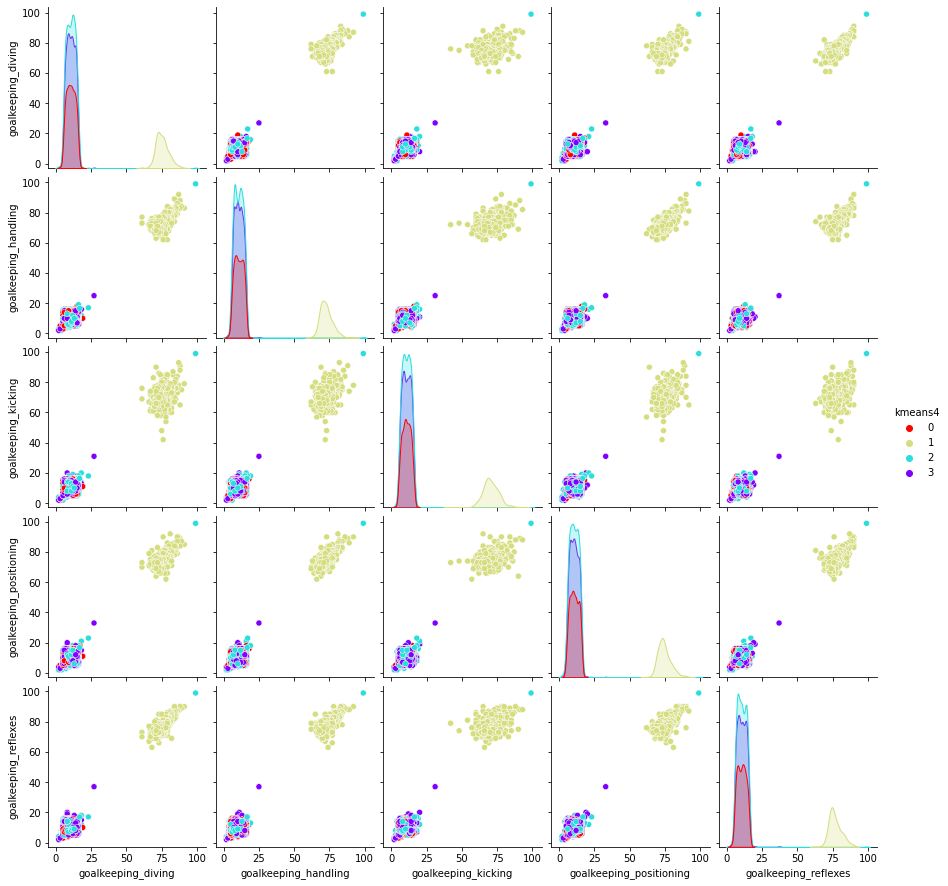

In [ ]:
## Graficamos las skills de arquero contra los 4 clusters estimados#

sns.pairplot(df_clust[skills_gk], hue = 'kmeans4', palette = 'rainbow_r');

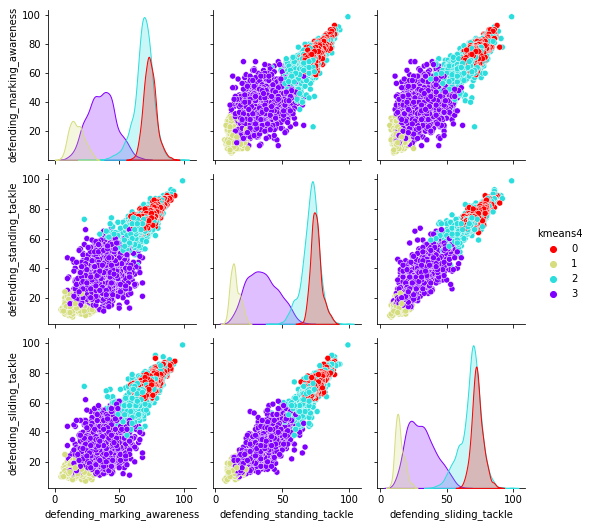

In [ ]:
## Graficamos las skills de defensor contra los 4 clusters estimados#
sns.pairplot(df_clust[skills_def], hue ='kmeans4', palette = 'rainbow_r');

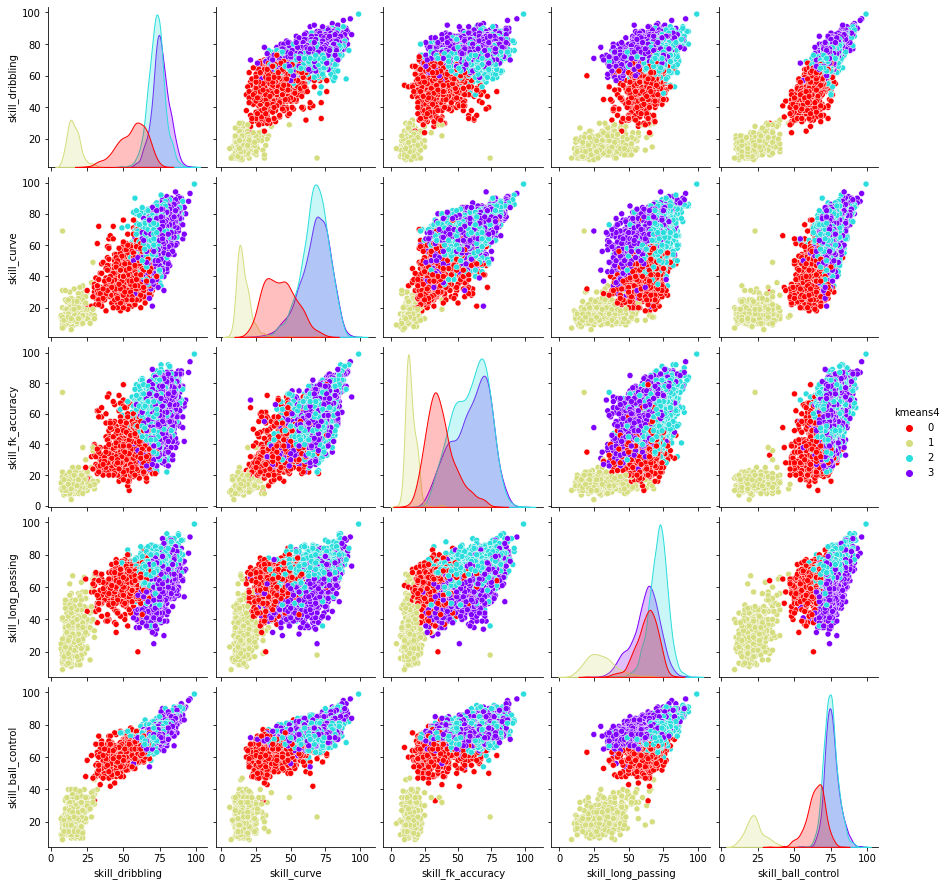

In [ ]:
## Mismo análisis para los mediocampistas
sns.pairplot(df_clust[skills_mid], hue ='kmeans4', palette = 'rainbow_r');

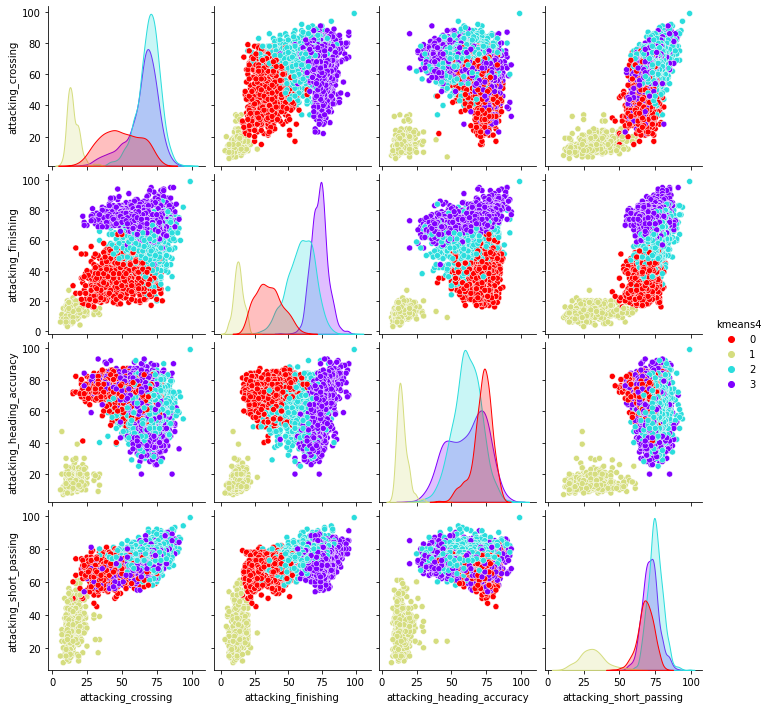

In [ ]:
## Para delanteros
sns.pairplot(df_clust[skills_at], hue ='kmeans4', palette = 'rainbow_r');

# Clustering Mean Shift

In [ ]:

from sklearn.cluster import KMeans,MeanShift
from sklearn import decomposition
from sklearn.cluster import estimate_bandwidth
bw=estimate_bandwidth(df2, quantile=0.09, n_samples=None, random_state=0, n_jobs=None)

ms = MeanShift(bandwidth= bw)

ms.fit(df2)

clusters2 = ms.labels_
cluster_centers = ms.cluster_centers_

labels_unique = np.unique(clusters2)
n_clusters_ = len(labels_unique)

print("Cantidad de clusters encontrados por Mean Shift : %d" % n_clusters_)


Cantidad de clusters encontrados por Mean Shift : 5


In [ ]:
df2['ms_labels'] = ms.labels_

In [ ]:
# Cantidad de observaciones por cluster
df2.ms_labels.value_counts()

0    2584
1    1566
2     443
4       1
3       1
Name: ms_labels, dtype: int64

In [ ]:
df2.head()

,pace,shooting,passing,dribbling,defending,physic,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking_awareness,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ms_labels
0,85.0,92.0,91.0,95.0,34.0,65.0,85.0,95.0,70.0,91.0,88.0,96.0,93.0,94.0,91.0,96.0,91.0,80.0,91.0,94.0,95.0,86.0,68.0,72.0,69.0,94.0,44.0,40.0,93.0,95.0,75.0,96.0,20.0,35.0,24.0,6.0,11.0,15.0,14.0,8.0,1
1,78.0,92.0,79.0,86.0,44.0,82.0,71.0,95.0,90.0,85.0,89.0,85.0,79.0,85.0,70.0,88.0,77.0,79.0,77.0,93.0,82.0,90.0,85.0,76.0,86.0,87.0,81.0,49.0,95.0,81.0,90.0,88.0,35.0,42.0,19.0,15.0,6.0,12.0,8.0,10.0,1
2,87.0,94.0,80.0,88.0,34.0,75.0,87.0,95.0,90.0,80.0,86.0,88.0,81.0,84.0,77.0,88.0,85.0,88.0,86.0,94.0,74.0,94.0,95.0,77.0,77.0,93.0,63.0,29.0,95.0,76.0,88.0,95.0,24.0,32.0,24.0,7.0,11.0,15.0,14.0,11.0,1
3,91.0,83.0,86.0,94.0,37.0,63.0,85.0,83.0,63.0,86.0,86.0,95.0,88.0,87.0,81.0,95.0,93.0,89.0,96.0,89.0,84.0,80.0,64.0,81.0,53.0,81.0,63.0,37.0,86.0,90.0,93.0,93.0,35.0,32.0,29.0,9.0,9.0,15.0,15.0,11.0,1
4,76.0,86.0,93.0,88.0,64.0,78.0,94.0,82.0,55.0,94.0,82.0,88.0,85.0,83.0,93.0,91.0,76.0,76.0,79.0,91.0,78.0,91.0,63.0,89.0,74.0,91.0,76.0,66.0,88.0,94.0,83.0,89.0,68.0,65.0,53.0,15.0,13.0,5.0,10.0,13.0,0


In [ ]:
# Análisis descriptivo, separando por cluster
# Creamos un objeto con todas las skills
skills_ra = [ 'pace', 'shooting', 'passing', 'dribbling',
       'defending', 'physic', 'attacking_crossing', 'attacking_finishing',
       'attacking_heading_accuracy', 'attacking_short_passing',
       'attacking_volleys', 'skill_dribbling', 'skill_curve',
       'skill_fk_accuracy', 'skill_long_passing', 'skill_ball_control',
       'movement_acceleration', 'movement_sprint_speed', 'movement_agility',
       'movement_reactions', 'movement_balance', 'power_shot_power',
       'power_jumping', 'power_stamina', 'power_strength', 'power_long_shots',
       'mentality_aggression', 'mentality_interceptions',
       'mentality_positioning', 'mentality_vision', 'mentality_penalties',
       'mentality_composure', 'defending_marking_awareness',
       'defending_standing_tackle', 'defending_sliding_tackle',
       'goalkeeping_diving', 'goalkeeping_handling', 'goalkeeping_kicking',
       'goalkeeping_positioning', 'goalkeeping_reflexes']

# Skills de arquero:
skills_gk = ['goalkeeping_diving', 'goalkeeping_handling', 'goalkeeping_kicking',
       'goalkeeping_positioning', 'goalkeeping_reflexes','ms_labels']

# Skills de defensor:
skills_def = [ 'defending_marking_awareness',
       'defending_standing_tackle', 'defending_sliding_tackle','ms_labels']
# Skills de atacantes:
skills_at = ['attacking_crossing', 'attacking_finishing',
       'attacking_heading_accuracy', 'attacking_short_passing', 'ms_labels']

# Skills de mediocampo:
skills_mid = ['skill_dribbling', 'skill_curve',
       'skill_fk_accuracy', 'skill_long_passing', 'skill_ball_control', 'ms_labels']

# Skills de Movimiento y balance
skills_movement = ['movement_acceleration', 'movement_sprint_speed', 'movement_agility',
       'movement_reactions', 'movement_balance', 'ms_labels']

# Skills de Fuerza
skills_power = ['power_shot_power',
       'power_jumping', 'power_stamina', 'power_strength', 'power_long_shots', 'ms_labels']

# Skills Mentales
skills_mental = ['mentality_aggression', 'mentality_interceptions',
       'mentality_positioning', 'mentality_vision', 'mentality_penalties',
       'mentality_composure', 'ms_labels']

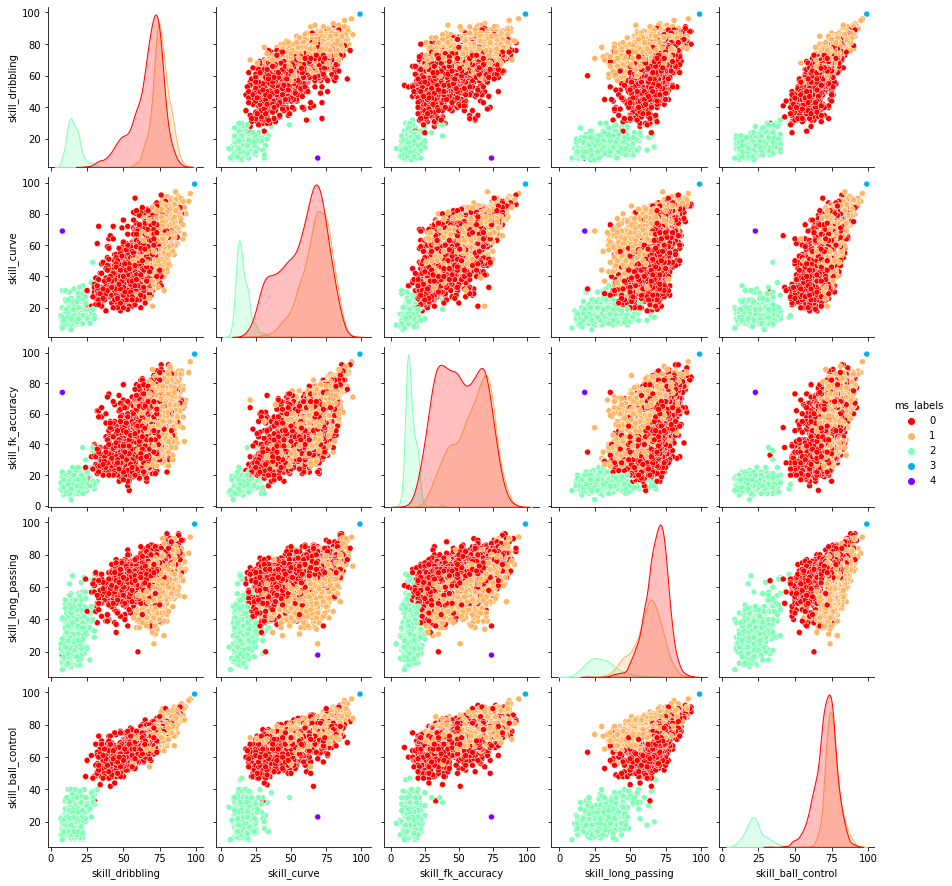

In [ ]:
sns.pairplot(df2[skills_mid],hue ='ms_labels' ,palette = 'rainbow_r');

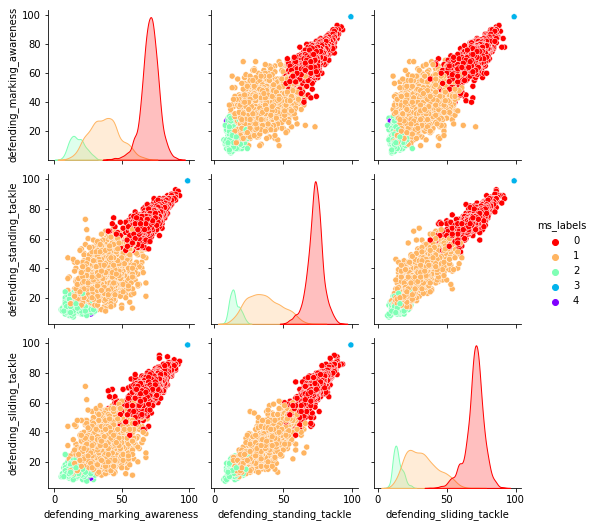

In [ ]:
sns.pairplot(df2[skills_def],hue ='ms_labels' ,palette = 'rainbow_r');

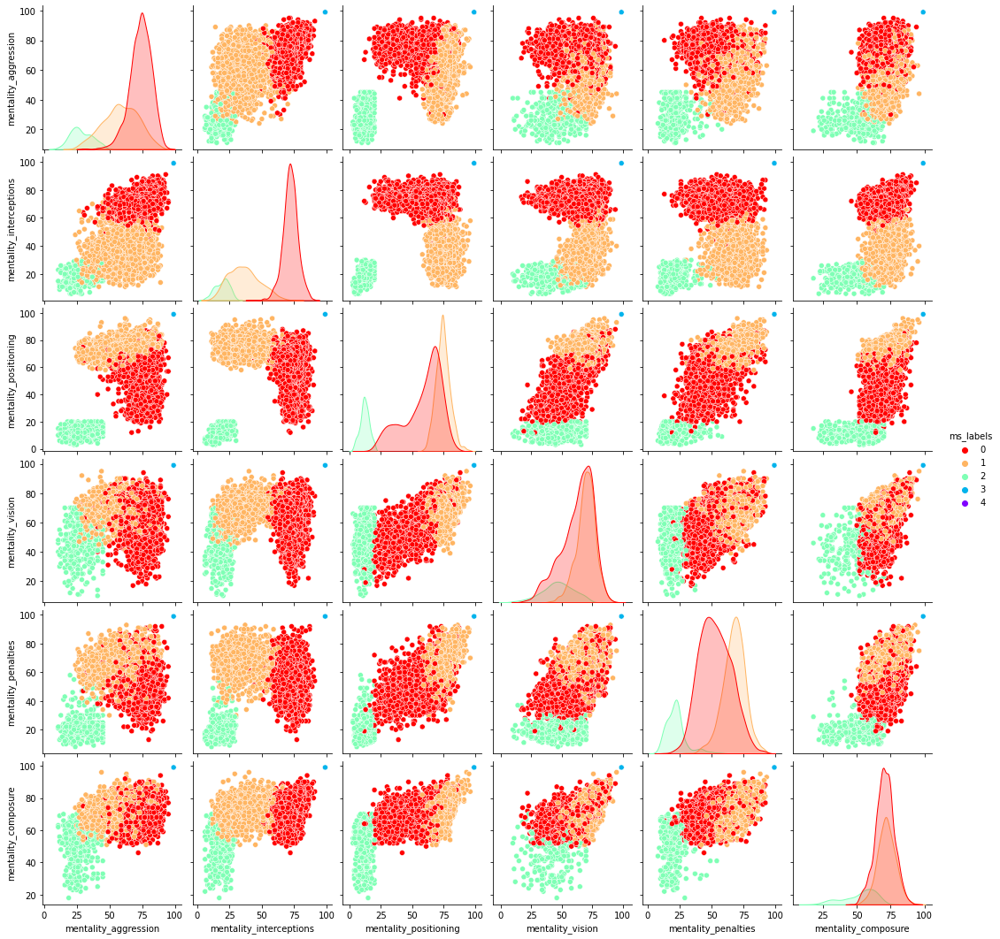

In [ ]:
sns.pairplot(df2[skills_mental],hue ='ms_labels' ,palette = 'rainbow_r');

In [ ]:
df3 = df2.merge(posiciones, left_index=True, right_index=True, how='left')

In [ ]:
df3.head(5)

,pace,shooting,passing,dribbling,defending,physic,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking_awareness,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ms_labels,Posicion2
0,85.0,92.0,91.0,95.0,34.0,65.0,85.0,95.0,70.0,91.0,88.0,96.0,93.0,94.0,91.0,96.0,91.0,80.0,91.0,94.0,95.0,86.0,68.0,72.0,69.0,94.0,44.0,40.0,93.0,95.0,75.0,96.0,20.0,35.0,24.0,6.0,11.0,15.0,14.0,8.0,1,Delantero
1,78.0,92.0,79.0,86.0,44.0,82.0,71.0,95.0,90.0,85.0,89.0,85.0,79.0,85.0,70.0,88.0,77.0,79.0,77.0,93.0,82.0,90.0,85.0,76.0,86.0,87.0,81.0,49.0,95.0,81.0,90.0,88.0,35.0,42.0,19.0,15.0,6.0,12.0,8.0,10.0,1,Delantero
2,87.0,94.0,80.0,88.0,34.0,75.0,87.0,95.0,90.0,80.0,86.0,88.0,81.0,84.0,77.0,88.0,85.0,88.0,86.0,94.0,74.0,94.0,95.0,77.0,77.0,93.0,63.0,29.0,95.0,76.0,88.0,95.0,24.0,32.0,24.0,7.0,11.0,15.0,14.0,11.0,1,Delantero
3,91.0,83.0,86.0,94.0,37.0,63.0,85.0,83.0,63.0,86.0,86.0,95.0,88.0,87.0,81.0,95.0,93.0,89.0,96.0,89.0,84.0,80.0,64.0,81.0,53.0,81.0,63.0,37.0,86.0,90.0,93.0,93.0,35.0,32.0,29.0,9.0,9.0,15.0,15.0,11.0,1,Delantero
4,76.0,86.0,93.0,88.0,64.0,78.0,94.0,82.0,55.0,94.0,82.0,88.0,85.0,83.0,93.0,91.0,76.0,76.0,79.0,91.0,78.0,91.0,63.0,89.0,74.0,91.0,76.0,66.0,88.0,94.0,83.0,89.0,68.0,65.0,53.0,15.0,13.0,5.0,10.0,13.0,0,Mediocampista


In [ ]:
data_crosstab = pd.crosstab(df3['ms_labels'],
                            df3['Posicion2'], 
                               margins = False)
print(data_crosstab)

Posicion2  Arquero  Defensor  Delantero  Mediocampista
ms_labels                                             
0                0      1485        104            994
1                0         0       1228            338
2              443         0          0              0
4                1         0          0              0


In [ ]:
## La categoria 0 agrupa a todos los defensores, a unos pocos delanteros y a muchos mediocampistas
## La categoria 1 agrupa a casi todos los delanteros y a una parte de los mediocampistas
## Otra categoria es para todos los arqueros y la categoría 4 es para un arquero de muy bajo rendimiento

,pace,shooting,passing,dribbling,defending,physic,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking_awareness,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ms_labels
0,85.000000,92.000000,91.000000,95.000000,34.000000,65.000000,85.000000,95.000000,70.000000,91.000000,88.000000,96.000000,93.000000,94.000000,91.00000,96.000000,91.000000,80.000000,91.00000,94.000000,95.000000,86.000000,68.00000,72.000000,69.00000,94.000000,44.000000,40.000000,93.000000,95.000000,75.000000,96.0000,20.000000,35.00000,24.00000,6.000000,11.000000,15.000000,14.000000,8.000000,1
1,78.000000,92.000000,79.000000,86.000000,44.000000,82.000000,71.000000,95.000000,90.000000,85.000000,89.000000,85.000000,79.000000,85.000000,70.00000,88.000000,77.000000,79.000000,77.00000,93.000000,82.000000,90.000000,85.00000,76.000000,86.00000,87.000000,81.000000,49.000000,95.000000,81.000000,90.000000,88.0000,35.000000,42.00000,19.00000,15.000000,6.000000,12.000000,8.000000,10.000000,1
2,87.000000,94.000000,80.000000,88.000000,34.000000,75.000000,87.000000,95.000000,90.000000,80.000000,86.000000,88.000000,81.000000,84.000000,77.00000,88.000000,85.000000,88.000000,86.00000,94.000000,74.000000,94.000000,95.00000,77.000000,77.00000,93.000000,63.000000,29.000000,95.000000,76.000000,88.000000,95.0000,24.000000,32.00000,24.00000,7.000000,11.000000,15.000000,14.000000,11.000000,1
3,91.000000,83.000000,86.000000,94.000000,37.000000,63.000000,85.000000,83.000000,63.000000,86.000000,86.000000,95.000000,88.000000,87.000000,81.00000,95.000000,93.000000,89.000000,96.00000,89.000000,84.000000,80.000000,64.00000,81.000000,53.00000,81.000000,63.000000,37.000000,86.000000,90.000000,93.000000,93.0000,35.000000,32.00000,29.00000,9.000000,9.000000,15.000000,15.000000,11.000000,1
4,76.000000,86.000000,93.000000,88.000000,64.000000,78.000000,94.000000,82.000000,55.000000,94.000000,82.000000,88.000000,85.000000,83.000000,93.00000,91.000000,76.000000,76.000000,79.00000,91.000000,78.000000,91.000000,63.00000,89.000000,74.00000,91.000000,76.000000,66.000000,88.000000,94.000000,83.000000,89.0000,68.000000,65.00000,53.00000,15.000000,13.000000,5.000000,10.000000,13.000000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4590,81.000000,51.000000,66.000000,70.000000,66.000000,67.000000,70.000000,61.000000,49.000000,71.000000,29.000000,71.000000,74.000000,35.000000,69.00000,72.000000,80.000000,82.000000,67.00000,58.000000,65.000000,45.000000,69.00000,73.000000,70.00000,40.000000,50.000000,64.000000,65.000000,59.000000,40.000000,70.0000,68.000000,70.00000,67.00000,12.000000,12.000000,11.000000,15.000000,9.000000,0
4591,76.000000,70.000000,60.000000,65.000000,39.000000,71.000000,64.000000,74.000000,72.000000,63.000000,58.000000,66.000000,56.000000,49.000000,57.00000,65.000000,79.000000,74.000000,55.00000,70.000000,75.000000,74.000000,68.00000,65.000000,74.00000,63.000000,70.000000,30.000000,73.000000,59.000000,63.000000,59.0000,35.000000,38.00000,34.00000,14.000000,15.000000,14.000000,12.000000,8.000000,1
4592,61.000000,62.000000,67.000000,71.000000,65.000000,73.000000,57.000000,61.000000,54.000000,70.000000,61.000000,71.000000,60.000000,49.000000,74.00000,78.000000,59.000000,62.000000,53.00000,71.000000,55.000000,62.000000,61.00000,78.000000,72.00000,66.000000,72.000000,66.000000,68.000000,71.000000,48.000000,74.0000,64.000000,7

In [ ]:
## CLUSTERING K MEDIAS PERO ELIMINANDO A LOS ARQUEROS DE LA BASE##
df_skills=df_skills.loc[df_skills.Posicion2!="Arquero"]
df4 = df_skills.copy()
df4 = df4.drop(columns = 'Posicion2')
imputer = SimpleImputer (missing_values = np.nan, strategy = 'most_frequent')
df4 = pd.DataFrame ( imputer.fit_transform(df4), columns = df4.columns, index = df4.index)




In [ ]:
df4.shape

(4151, 40)

In [ ]:
posiciones2=df_skills.loc[:,['Posicion2']]

In [ ]:
posiciones2.shape

(4151, 1)

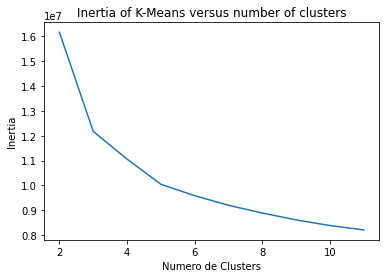

In [ ]:
scores = [KMeans (n_clusters = i).fit(df4).inertia_ for i in range (2,12)]

plt.plot(np.arange(2,12), scores);
plt.xlabel('Numero de Clusters')
plt.ylabel('Inertia')
plt.title('Inertia of K-Means versus number of clusters');
## Se seleccionan 3 clusters

In [ ]:
n_clust = 3

km = KMeans(n_clusters = n_clust)
km.fit(df4)

clusters = km.labels_

In [ ]:
df_clust2 = df4.copy()
df_clust2['kmeans4'] = km.labels_

print('KMeans encontro: ', max(km.labels_)+1, 'clusters, nosotros forzamos la cantidad')
df_clust2

KMeans encontro:  3 clusters, nosotros forzamos la cantidad


,pace,shooting,passing,dribbling,defending,physic,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking_awareness,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,kmeans4
0,85.000000,92.000000,91.000000,95.000000,34.000000,65.000000,85.000000,95.000000,70.000000,91.000000,88.000000,96.000000,93.000000,94.000000,91.00000,96.000000,91.000000,80.000000,91.00000,94.000000,95.000000,86.000000,68.00000,72.000000,69.00000,94.000000,44.000000,40.000000,93.000000,95.000000,75.000000,96.0000,20.000000,35.00000,24.00000,6.000000,11.000000,15.000000,14.000000,8.000000,1
1,78.000000,92.000000,79.000000,86.000000,44.000000,82.000000,71.000000,95.000000,90.000000,85.000000,89.000000,85.000000,79.000000,85.000000,70.00000,88.000000,77.000000,79.000000,77.00000,93.000000,82.000000,90.000000,85.00000,76.000000,86.00000,87.000000,81.000000,49.000000,95.000000,81.000000,90.000000,88.0000,35.000000,42.00000,19.00000,15.000000,6.000000,12.000000,8.000000,10.000000,1
2,87.000000,94.000000,80.000000,88.000000,34.000000,75.000000,87.000000,95.000000,90.000000,80.000000,86.000000,88.000000,81.000000,84.000000,77.00000,88.000000,85.000000,88.000000,86.00000,94.000000,74.000000,94.000000,95.00000,77.000000,77.00000,93.000000,63.000000,29.000000,95.000000,76.000000,88.000000,95.0000,24.000000,32.00000,24.00000,7.000000,11.000000,15.000000,14.000000,11.000000,1
3,91.000000,83.000000,86.000000,94.000000,37.000000,63.000000,85.000000,83.000000,63.000000,86.000000,86.000000,95.000000,88.000000,87.000000,81.00000,95.000000,93.000000,89.000000,96.00000,89.000000,84.000000,80.000000,64.00000,81.000000,53.00000,81.000000,63.000000,37.000000,86.000000,90.000000,93.000000,93.0000,35.000000,32.00000,29.00000,9.000000,9.000000,15.000000,15.000000,11.000000,1
4,76.000000,86.000000,93.000000,88.000000,64.000000,78.000000,94.000000,82.000000,55.000000,94.000000,82.000000,88.000000,85.000000,83.000000,93.00000,91.000000,76.000000,76.000000,79.00000,91.000000,78.000000,91.000000,63.00000,89.000000,74.00000,91.000000,76.000000,66.000000,88.000000,94.000000,83.000000,89.0000,68.000000,65.00000,53.00000,15.000000,13.000000,5.000000,10.000000,13.000000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4590,81.000000,51.000000,66.000000,70.000000,66.000000,67.000000,70.000000,61.000000,49.000000,71.000000,29.000000,71.000000,74.000000,35.000000,69.00000,72.000000,80.000000,82.000000,67.00000,58.000000,65.000000,45.000000,69.00000,73.000000,70.00000,40.000000,50.000000,64.000000,65.000000,59.000000,40.000000,70.0000,68.000000,70.00000,67.00000,12.000000,12.000000,11.000000,15.000000,9.000000,0
4591,76.000000,70.000000,60.000000,65.000000,39.000000,71.000000,64.000000,74.000000,72.000000,63.000000,58.000000,66.000000,56.000000,49.000000,57.00000,65.000000,79.000000,74.000000,55.00000,70.000000,75.000000,74.000000,68.00000,65.000000,74.00000,63.000000,70.000000,30.000000,73.000000,59.000000,63.000000,59.0000,35.000000,38.00000,34.00000,14.000000,15.000000,14.000000,12.000000,8.000000,1
4592,61.000000,62.000000,67.000000,71.000000,65.000000,73.000000,57.000000,61.000000,54.000000,70.000000,61.000000,71.000000,60.000000,49.000000,74.00000,78.000000,59.000000,62.000000,53.00000,71.000000,55.000000,62.000000,61.00000,78.000000,72.00000,66.000000,72.000000,66.000000,68.000000,71.000000,48.000000,74.0000,64.000000,70.

In [ ]:
# Creamos un objeto con todas las skills
skills_ra = [ 'pace', 'shooting', 'passing', 'dribbling',
       'defending', 'physic', 'attacking_crossing', 'attacking_finishing',
       'attacking_heading_accuracy', 'attacking_short_passing',
       'attacking_volleys', 'skill_dribbling', 'skill_curve',
       'skill_fk_accuracy', 'skill_long_passing', 'skill_ball_control',
       'movement_acceleration', 'movement_sprint_speed', 'movement_agility',
       'movement_reactions', 'movement_balance', 'power_shot_power',
       'power_jumping', 'power_stamina', 'power_strength', 'power_long_shots',
       'mentality_aggression', 'mentality_interceptions',
       'mentality_positioning', 'mentality_vision', 'mentality_penalties',
       'mentality_composure', 'defending_marking_awareness',
       'defending_standing_tackle', 'defending_sliding_tackle',
       'goalkeeping_diving', 'goalkeeping_handling', 'goalkeeping_kicking',
       'goalkeeping_positioning', 'goalkeeping_reflexes']

# Skills de arquero:
skills_gk = ['goalkeeping_diving', 'goalkeeping_handling', 'goalkeeping_kicking',
       'goalkeeping_positioning', 'goalkeeping_reflexes','kmeans4']

# Skills de defensor:
skills_def = [ 'defending_marking_awareness',
       'defending_standing_tackle', 'defending_sliding_tackle','kmeans4']
# Skills de atacantes:
skills_at = ['attacking_crossing', 'attacking_finishing',
       'attacking_heading_accuracy', 'attacking_short_passing', 'kmeans4']

# Skills de mediocampo:
skills_mid = ['skill_dribbling', 'skill_curve',
       'skill_fk_accuracy', 'skill_long_passing', 'skill_ball_control', 'kmeans4']

# Skills de Movimiento y balance
skills_movement = ['movement_acceleration', 'movement_sprint_speed', 'movement_agility',
       'movement_reactions', 'movement_balance', 'kmeans4']

# Skills de Fuerza
skills_power = ['power_shot_power',
       'power_jumping', 'power_stamina', 'power_strength', 'power_long_shots', 'kmeans4']

# Skills Mentales
skills_mental = ['mentality_aggression', 'mentality_interceptions',
       'mentality_positioning', 'mentality_vision', 'mentality_penalties',
       'mentality_composure', 'kmeans4']

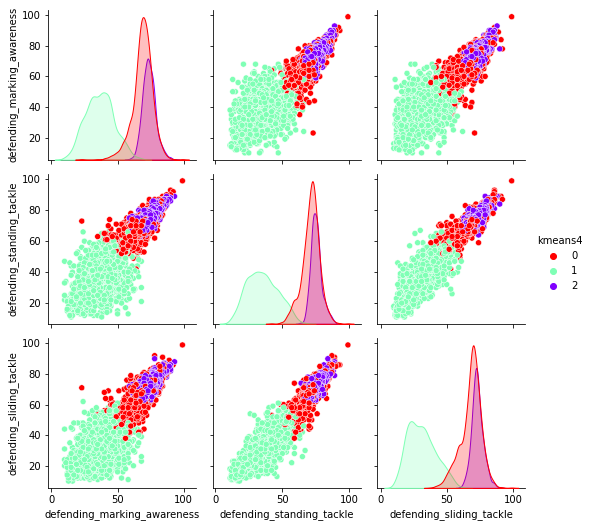

In [ ]:
## Graficamos las skills de defensor contra los 3 clusters estimados#
sns.pairplot(df_clust2[skills_def], hue ='kmeans4', palette = 'rainbow_r');

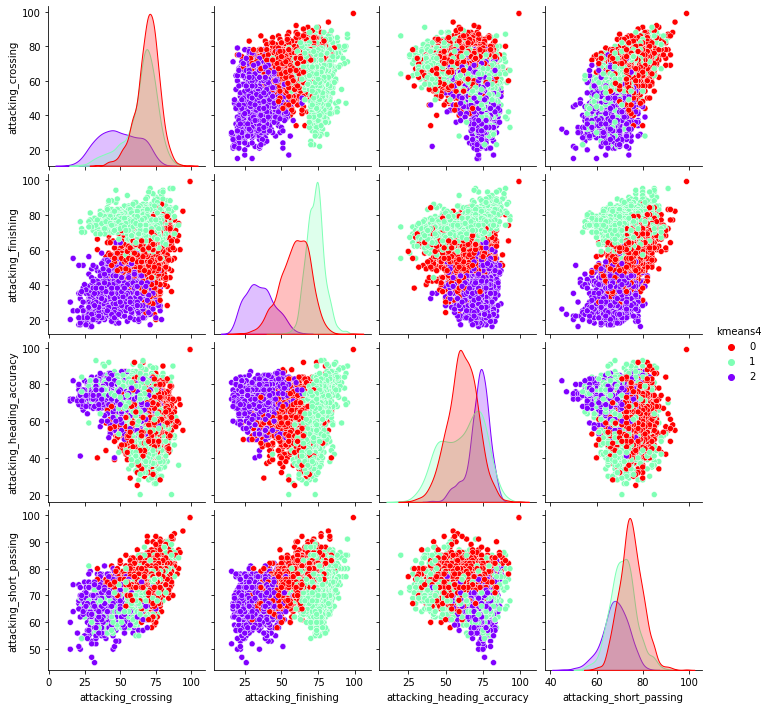

In [ ]:
## Graficamos las skills de atacante contra los 3 clusters estimados#
sns.pairplot(df_clust2[skills_at], hue ='kmeans4', palette = 'rainbow_r');

In [ ]:
df5 = df_clust2.merge(posiciones2, left_index=True, right_index=True, how='left')

In [ ]:
df5.head()

,pace,shooting,passing,dribbling,defending,physic,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking_awareness,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,kmeans4,Posicion2
0,85.0,92.0,91.0,95.0,34.0,65.0,85.0,95.0,70.0,91.0,88.0,96.0,93.0,94.0,91.0,96.0,91.0,80.0,91.0,94.0,95.0,86.0,68.0,72.0,69.0,94.0,44.0,40.0,93.0,95.0,75.0,96.0,20.0,35.0,24.0,6.0,11.0,15.0,14.0,8.0,1,Delantero
1,78.0,92.0,79.0,86.0,44.0,82.0,71.0,95.0,90.0,85.0,89.0,85.0,79.0,85.0,70.0,88.0,77.0,79.0,77.0,93.0,82.0,90.0,85.0,76.0,86.0,87.0,81.0,49.0,95.0,81.0,90.0,88.0,35.0,42.0,19.0,15.0,6.0,12.0,8.0,10.0,1,Delantero
2,87.0,94.0,80.0,88.0,34.0,75.0,87.0,95.0,90.0,80.0,86.0,88.0,81.0,84.0,77.0,88.0,85.0,88.0,86.0,94.0,74.0,94.0,95.0,77.0,77.0,93.0,63.0,29.0,95.0,76.0,88.0,95.0,24.0,32.0,24.0,7.0,11.0,15.0,14.0,11.0,1,Delantero
3,91.0,83.0,86.0,94.0,37.0,63.0,85.0,83.0,63.0,86.0,86.0,95.0,88.0,87.0,81.0,95.0,93.0,89.0,96.0,89.0,84.0,80.0,64.0,81.0,53.0,81.0,63.0,37.0,86.0,90.0,93.0,93.0,35.0,32.0,29.0,9.0,9.0,15.0,15.0,11.0,1,Delantero
4,76.0,86.0,93.0,88.0,64.0,78.0,94.0,82.0,55.0,94.0,82.0,88.0,85.0,83.0,93.0,91.0,76.0,76.0,79.0,91.0,78.0,91.0,63.0,89.0,74.0,91.0,76.0,66.0,88.0,94.0,83.0,89.0,68.0,65.0,53.0,15.0,13.0,5.0,10.0,13.0,0,Mediocampista


In [ ]:
data_crosstab = pd.crosstab(df5['kmeans4'],
                            df5['Posicion2'], 
                               margins = False)
print(data_crosstab)

Posicion2  Defensor  Delantero  Mediocampista
kmeans4                                      
0               660        132            934
1                 0       1200            299
2               825          0             99


In [ ]:
## Clustering-Mean-Shift-sin-arqueros

In [ ]:
del df_clust2['kmeans4']

In [ ]:
bw=estimate_bandwidth(df_clust2, quantile=0.09, n_samples=None, random_state=0, n_jobs=None)

ms = MeanShift(bandwidth= bw)

ms.fit(df_clust2)

clusters2 = ms.labels_
cluster_centers = ms.cluster_centers_

labels_unique = np.unique(clusters2)
n_clusters_ = len(labels_unique)

print("Cantidad de clusters encontrados por Mean Shift : %d" % n_clusters_)


Cantidad de clusters encontrados por Mean Shift : 5


In [ ]:
df_clust2['ms_labels'] = ms.labels_

In [ ]:
# Cantidad de observaciones por cluster
df_clust2.ms_labels.value_counts()

0    2071
1    1555
3     408
4     116
2       1
Name: ms_labels, dtype: int64

In [ ]:
# Análisis descriptivo, separando por cluster
# Creamos un objeto con todas las skills
skills_ra = [ 'pace', 'shooting', 'passing', 'dribbling',
       'defending', 'physic', 'attacking_crossing', 'attacking_finishing',
       'attacking_heading_accuracy', 'attacking_short_passing',
       'attacking_volleys', 'skill_dribbling', 'skill_curve',
       'skill_fk_accuracy', 'skill_long_passing', 'skill_ball_control',
       'movement_acceleration', 'movement_sprint_speed', 'movement_agility',
       'movement_reactions', 'movement_balance', 'power_shot_power',
       'power_jumping', 'power_stamina', 'power_strength', 'power_long_shots',
       'mentality_aggression', 'mentality_interceptions',
       'mentality_positioning', 'mentality_vision', 'mentality_penalties',
       'mentality_composure', 'defending_marking_awareness',
       'defending_standing_tackle', 'defending_sliding_tackle',
       'goalkeeping_diving', 'goalkeeping_handling', 'goalkeeping_kicking',
       'goalkeeping_positioning', 'goalkeeping_reflexes']

# Skills de arquero:
skills_gk = ['goalkeeping_diving', 'goalkeeping_handling', 'goalkeeping_kicking',
       'goalkeeping_positioning', 'goalkeeping_reflexes','ms_labels']

# Skills de defensor:
skills_def = [ 'defending_marking_awareness',
       'defending_standing_tackle', 'defending_sliding_tackle','ms_labels']
# Skills de atacantes:
skills_at = ['attacking_crossing', 'attacking_finishing',
       'attacking_heading_accuracy', 'attacking_short_passing', 'ms_labels']

# Skills de mediocampo:
skills_mid = ['skill_dribbling', 'skill_curve',
       'skill_fk_accuracy', 'skill_long_passing', 'skill_ball_control', 'ms_labels']

# Skills de Movimiento y balance
skills_movement = ['movement_acceleration', 'movement_sprint_speed', 'movement_agility',
       'movement_reactions', 'movement_balance', 'ms_labels']

# Skills de Fuerza
skills_power = ['power_shot_power',
       'power_jumping', 'power_stamina', 'power_strength', 'power_long_shots', 'ms_labels']

# Skills Mentales
skills_mental = ['mentality_aggression', 'mentality_interceptions',
       'mentality_positioning', 'mentality_vision', 'mentality_penalties',
       'mentality_composure', 'ms_labels']

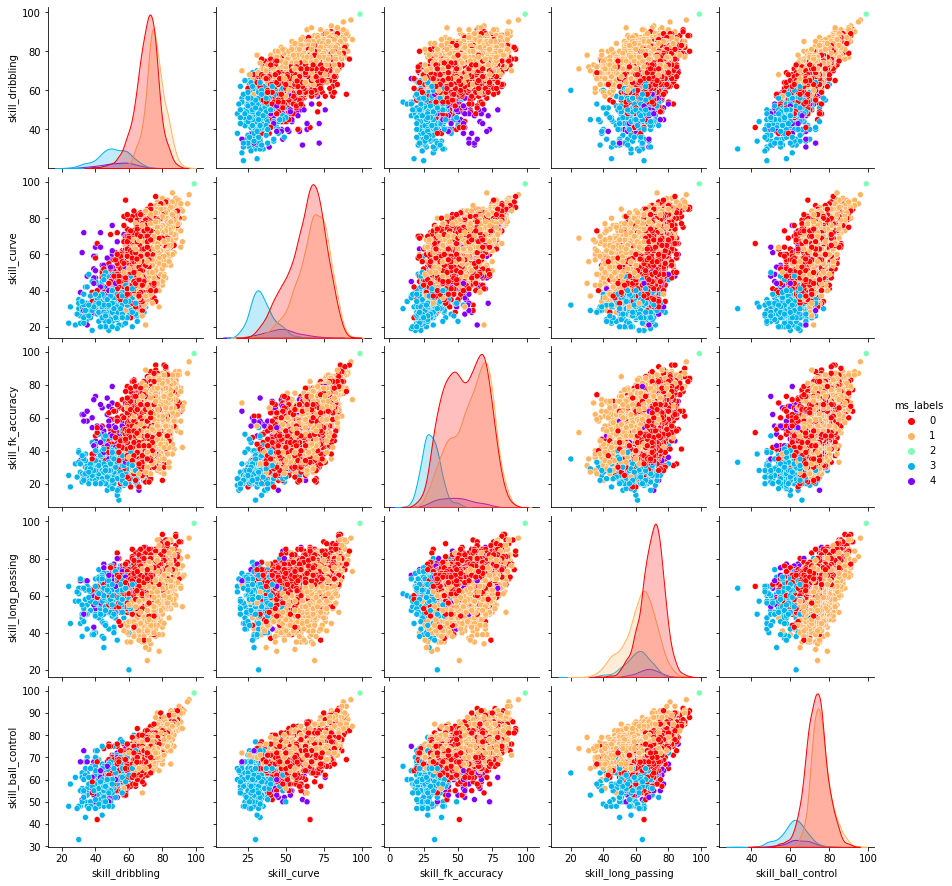

In [ ]:
sns.pairplot(df_clust2[skills_mid],hue ='ms_labels' ,palette = 'rainbow_r');

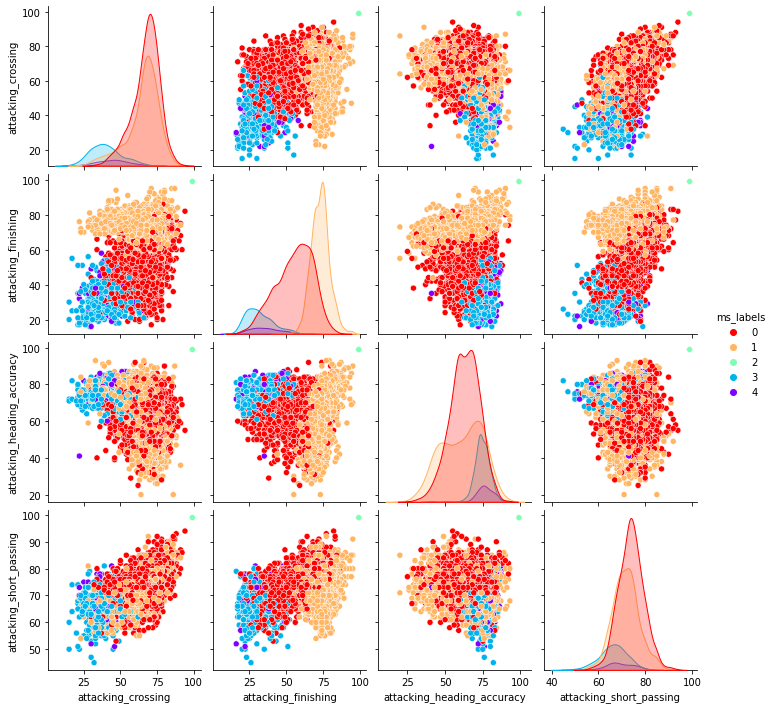

In [ ]:
sns.pairplot(df_clust2[skills_at],hue ='ms_labels' ,palette = 'rainbow_r');

In [ ]:
df6 = df_clust2.merge(posiciones2, left_index=True, right_index=True, how='left')

In [ ]:
data_crosstab = pd.crosstab(df6['ms_labels'],
                            df6['Posicion2'], 
                               margins = False)
print(data_crosstab)

Posicion2  Defensor  Delantero  Mediocampista
ms_labels                                    
0               977        106            987
1                 0       1226            329
3               400          0              8
4               108          0              8
